In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# load dataset into Pandas DataFrame
df = pd.read_csv(r"C:\Users\logic\Documents\datascience\iris.csv", names=['sepal length','sepal width','petal length','petal width','target'])

In [2]:
df

,sepal length,sepal width,petal length,petal width,target
0,5.1,3.5,1.4,0.2,Iris-setosa
1,4.9,3.0,1.4,0.2,Iris-setosa
2,4.7,3.2,1.3,0.2,Iris-setosa
3,4.6,3.1,1.5,0.2,Iris-setosa
4,5.0,3.6,1.4,0.2,Iris-setosa
...,...,...,...,...,...
145,6.7,3.0,5.2,2.3,Iris-virginica
146,6.3,2.5,5.0,1.9,Iris-virginica
147,6.5,3.0,5.2,2.0,Iris-virginica
148,6.2,3.4,5.4,2.3,Iris-virginica


# Standardize the Data
##  PCA is effected by scale so you need to scale the features in your data before applying PCA. Use StandardScaler to help you standardize the dataset’s features onto unit scale (mean = 0 and variance = 1) which is a requirement for the optimal performance of many machine learning algorithms.

In [3]:
from sklearn.preprocessing import StandardScaler
features = ['sepal length', 'sepal width', 'petal length', 'petal width']
# Separating out the features
x = df.loc[:, features].values
# Separating out the target
y = df.loc[:,['target']].values
# Standardizing the features
x = StandardScaler().fit_transform(x)

# PCA Projection to 2D

## The original data has 4 columns (sepal length, sepal width, petal length, and petal width). In this section, the code projects the original data which is 4 dimensional into 2 dimensions. I should note that after dimensionality reduction, there usually isn’t a particular meaning assigned to each principal component. The new components are just the two main dimensions of variation.

In [4]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2'])

In [5]:
finalDf = pd.concat([principalDf, df[['target']]], axis = 1)

# Visualize 2D Projection
## This section is just plotting 2 dimensional data. Notice on the graph below that the classes seem well separated from each other. 

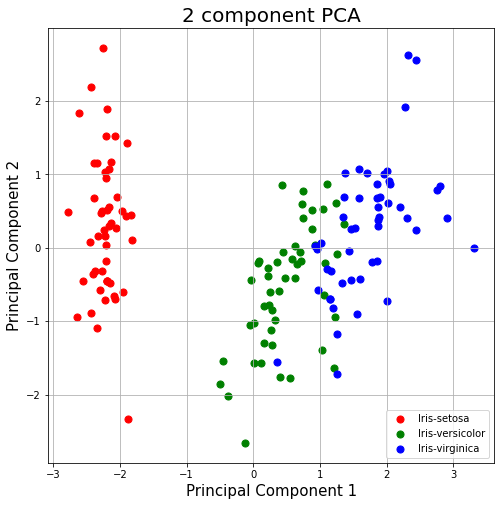

In [6]:
fig = plt.figure(figsize = (8,8))
ax = fig.add_subplot(1,1,1) 
ax.set_xlabel('Principal Component 1', fontsize = 15)
ax.set_ylabel('Principal Component 2', fontsize = 15)
ax.set_title('2 component PCA', fontsize = 20)
targets = ['Iris-setosa', 'Iris-versicolor', 'Iris-virginica']
colors = ['r', 'g', 'b']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['target'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'principal component 1']
               , finalDf.loc[indicesToKeep, 'principal component 2']
               , c = color
               , s = 50)
ax.legend(targets)
ax.grid()

# Explained Variance
The explained variance tells you how much information (variance) can be attributed to each of the principal components. This is important as while you can convert 4 dimensional space to 2 dimensional space, you lose some of the variance (information) when you do this. By using the attribute explained_variance_ratio_, you can see that the first principal component contains 72.77% of the variance and the second principal component contains 23.03% of the variance. Together, the two components contain 95.80% of the information.

In [7]:
pca.explained_variance_ratio_

array([0.72770452, 0.23030523])

# PCA to Speed-up Machine Learning Algorithms
While there are other ways to speed up machine learning algorithms, one less commonly known way is to use PCA. For this section, we aren’t using the IRIS dataset as the dataset only has 150 rows and only 4 feature columns. The MNIST database of handwritten digits is more suitable as it has 784 feature columns (784 dimensions), a training set of 60,000 examples, and a test set of 10,000 examples.

Download and Load the Data


In [8]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
df = pd.read_csv(r"C:\Users\logic\Documents\datascience\train.csv")

In [9]:
df

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
41995,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41996,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41997,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
41998,6,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [10]:
df.shape

(42000, 785)

In [11]:
df.sample()


,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
14198,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


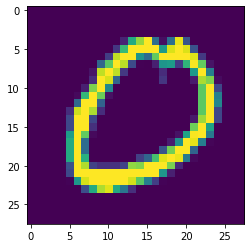

In [12]:
plt.imshow(df.iloc[13051,1:].values.reshape(28,28))

In [13]:
X = df.iloc[:,1:]
y = df.iloc[:,0]

#  Test Train Split

In [16]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test=train_test_split(X,y,test_size=0.2,random_state=42)

In [17]:
X_train.shape


(33600, 784)

#  Doing  KNN on the data set and checking its time since there are 784 calculations to find the neighbours

In [18]:
from sklearn.neighbors import KNeighborsClassifier

In [34]:
knn = KNeighborsClassifier()

In [35]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [36]:
import time
start = time.time()
y_pred = knn.predict(X_test)
print(time.time() - start)
# KNN Time

15.247189998626709


In [74]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)
# KNN ACCURACY

0.9534523809523809

# Now Doing PCA before KNN

In [38]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

In [76]:
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

In [77]:
# PCA 
from sklearn.decomposition import PCA
pca = PCA(n_components=200)

In [89]:
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [81]:
X_train_trf.shape
# after reducing to 200 dimensions from 784

(33600, 200)

In [91]:
knn.fit(X_train_trf,y_train)

KNeighborsClassifier()

In [92]:
y_pred = knn.predict(X_test_trf)

In [93]:
accuracy_score(y_test,y_pred)
# After PCA accuracy

0.9508333333333333

#   Getting accuracy score with each increasing dimensions we see accuracy increase 

In [94]:
# for dimensions 1 to 785
for i in range(1,785):
    pca = PCA(n_components=i)
    X_train_trf = pca.fit_transform(X_train)
    X_test_trf = pca.transform(X_test)
    
    knn = KNeighborsClassifier()
    
    knn.fit(X_train_trf,y_train)
    
    y_pred = knn.predict(X_test_trf)
    
    print(accuracy_score(y_test,y_pred))

0.2596428571428571
0.32404761904761903
0.5102380952380953
0.6661904761904762
0.7380952380952381
0.8225
0.8435714285714285
0.8720238095238095
0.8869047619047619
0.9051190476190476
0.911547619047619
0.9179761904761905
0.9276190476190476
0.9351190476190476
0.9392857142857143
0.9373809523809524
0.9402380952380952
0.9415476190476191
0.9425
0.945
0.9429761904761905
0.9439285714285715
0.944047619047619
0.9453571428571429
0.9473809523809524
0.9483333333333334
0.9482142857142857
0.9476190476190476
0.949047619047619
0.9492857142857143
0.9507142857142857
0.9511904761904761
0.9498809523809524
0.95
0.9515476190476191
0.9511904761904761
0.9514285714285714
0.9528571428571428
0.9525
0.9532142857142857
0.9529761904761904
0.9511904761904761
0.9542857142857143
0.9538095238095238
0.9528571428571428
0.9534523809523809
0.9530952380952381
0.9541666666666667
0.9527380952380953
0.9538095238095238
0.9534523809523809
0.9544047619047619
0.9534523809523809
0.9541666666666667
0.9542857142857143
0.9539285714285715
0

KeyboardInterrupt: 

# transforming to a 2D coordinate system

In [49]:

pca = PCA(n_components=2)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [50]:
X_train_trf

array([[-2.71858054, -0.49067777],
       [-0.67692952, -6.75340127],
       [-3.03324095,  6.50936776],
       ...,
       [ 2.14882861,  0.78173016],
       [ 1.05960522,  0.94701269],
       [17.70248106,  1.96300609]])

In [60]:
pip install plotly

Note: you may need to restart the kernel to use updated packages.


In [61]:
import plotly.express as px

y_train_trf = y_train.astype(str)
fig = px.scatter(x=X_train_trf[:,0],
                 y=X_train_trf[:,1],
                 color=y_train_trf,
                 color_discrete_sequence=px.colors.qualitative.G10
                )
fig.show()
# after doing PCA we can see all the digits correlation in 2D space

# transforming in 3D

In [62]:

pca = PCA(n_components=3)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [63]:
X_train_trf

array([[-2.71859535, -0.49003692,  1.13545174],
       [-0.6769976 , -6.75310311, -2.33651809],
       [-3.03325785,  6.50982181,  7.49187593],
       ...,
       [ 2.14874206,  0.78104806, -0.74751642],
       [ 1.05961994,  0.94736853,  3.94997301],
       [17.70263257,  1.96193476, -4.94313616]])

     ---------------------------------------- 15.2/15.2 MB 2.6 MB/s eta 0:00:00
  Using cached tenacity-8.0.1-py3-none-any.whl (24 kB)
Note: you may need to restart the kernel to use updated packages.


In [64]:
import plotly.express as px
y_train_trf = y_train.astype(str)
fig = px.scatter_3d(df, x=X_train_trf[:,0], y=X_train_trf[:,1], z=X_train_trf[:,2],
              color=y_train_trf)
fig.update_layout(
    margin=dict(l=20, r=20, t=20, b=20),
    paper_bgcolor="LightSteelBlue",
)
fig.show()
# after doing PCA we can see all the digits correlation in 3D space

In [65]:
pca.explained_variance_
# Eigen values

array([40.67111197, 29.17023394, 26.74459611])

In [66]:
pca.components_.shape
# Eigen vectors

(3, 784)

In [67]:
pca.explained_variance_ratio_

array([0.05785192, 0.0414927 , 0.03804239])

In [69]:
pca = PCA(n_components=None)
X_train_trf = pca.fit_transform(X_train)
X_test_trf = pca.transform(X_test)

In [ ]:
pca.explained_variance_.shape

In [71]:
pca.components_.shape

(784, 784)

In [72]:
np.cumsum(pca.explained_variance_ratio_)

array([0.05785192, 0.09934462, 0.13738701, 0.16704964, 0.19286525,
       0.21541506, 0.23514574, 0.25289854, 0.26858504, 0.28294568,
       0.29664822, 0.30892077, 0.32038989, 0.33162017, 0.34220546,
       0.35240477, 0.36198153, 0.37140862, 0.38053351, 0.38943521,
       0.39783462, 0.40603525, 0.41388828, 0.42145568, 0.42882829,
       0.43584714, 0.44282633, 0.44953738, 0.45593583, 0.4622392 ,
       0.46839271, 0.4744166 , 0.48025334, 0.48603881, 0.49176214,
       0.49722614, 0.50265822, 0.50793994, 0.51307376, 0.51801392,
       0.52289063, 0.52771041, 0.53239246, 0.53698588, 0.54156249,
       0.54605468, 0.5505015 , 0.55491691, 0.55926803, 0.56358836,
       0.56780645, 0.57198888, 0.57606882, 0.58008887, 0.58407223,
       0.58801822, 0.59188694, 0.59571889, 0.59948441, 0.60322635,
       0.60687487, 0.6104829 , 0.61402176, 0.61750117, 0.62094441,
       0.62432378, 0.62767368, 0.63099377, 0.63426257, 0.63746765,
       0.64065542, 0.64376931, 0.64686564, 0.64992395, 0.65296

In [ ]:
plt.plot(np.cumsum(pca.explained_variance_ratio_))